In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

In [ ]:
data=pd.read_csv('/content/outliersHandled.csv')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5054 entries, 0 to 5053
Data columns (total 57 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            5054 non-null   float64
 1   last_scraped                                  5054 non-null   object 
 2   name                                          5054 non-null   object 
 3   description                                   5054 non-null   object 
 4   neighborhood_overview                         5054 non-null   object 
 5   host_id                                       5054 non-null   int64  
 6   host_name                                     5054 non-null   object 
 7   host_since                                    5054 non-null   object 
 8   host_location                                 5054 non-null   object 
 9   host_about                                    5054 non-null   o

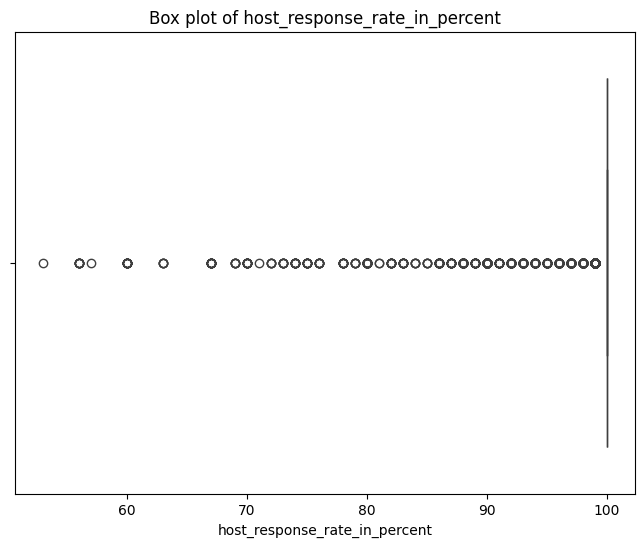

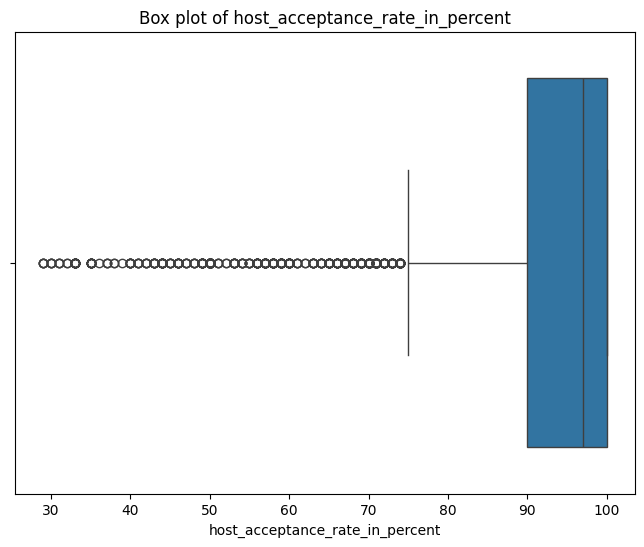

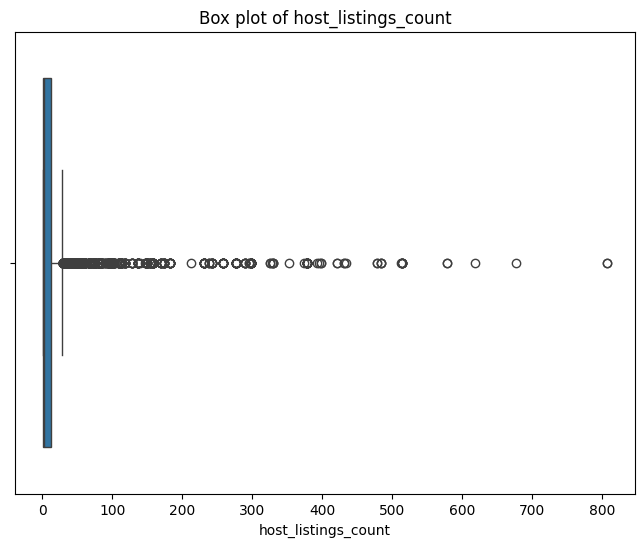

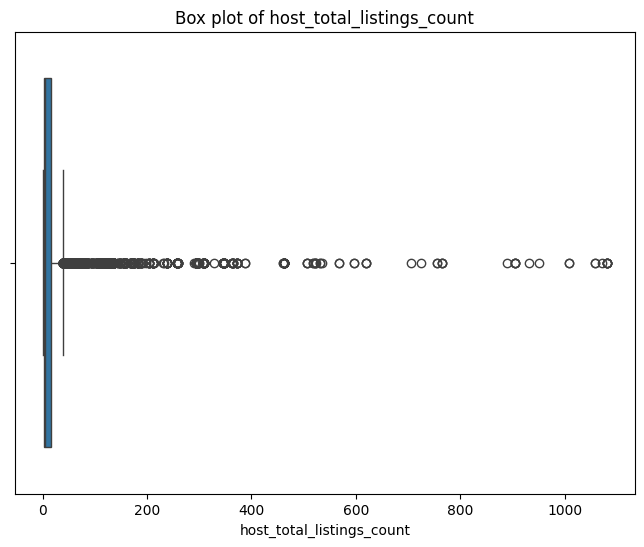

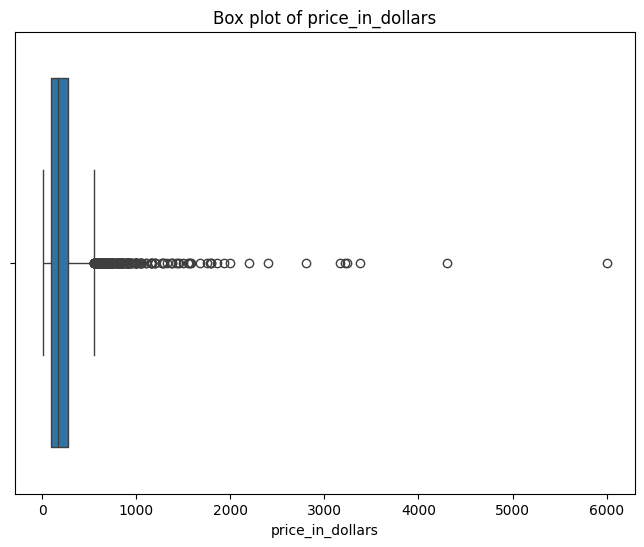

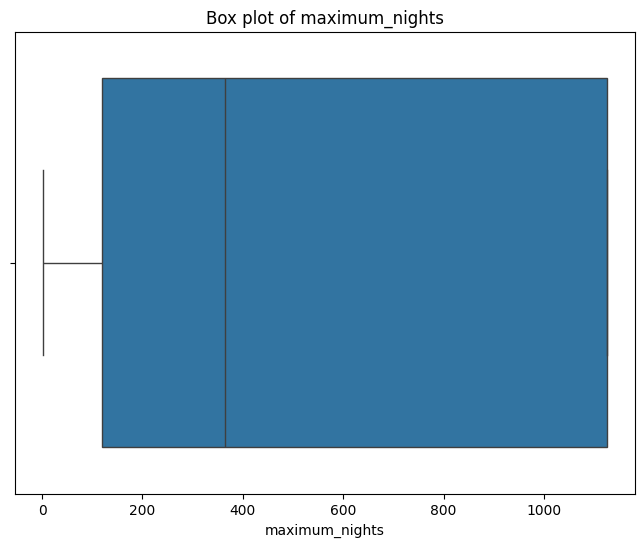

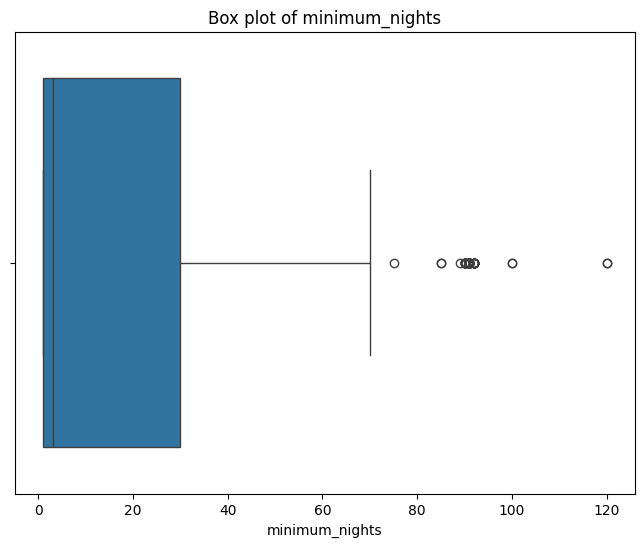

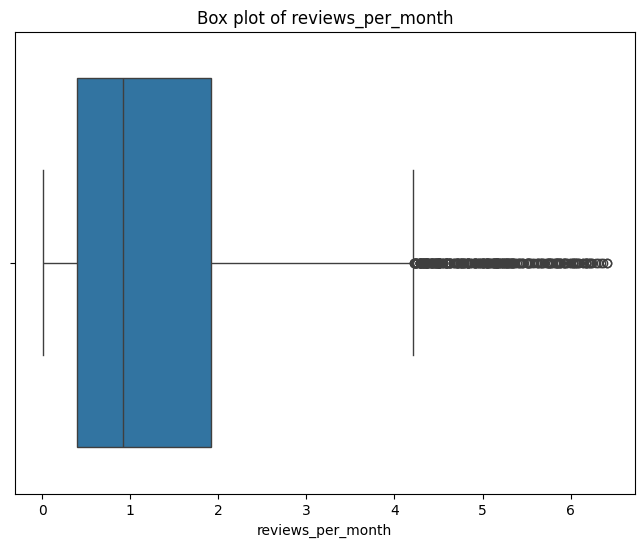

In [ ]:
data=pd.read_csv('/content/outliersHandled.csv')
#data.info()

columns_to_process = ['host_response_rate_in_percent', 'host_acceptance_rate_in_percent',
                      'host_listings_count', 'host_total_listings_count', 'price_in_dollars',
                      'maximum_nights', 'minimum_nights', 'reviews_per_month']

for col in columns_to_process:
  plt.figure(figsize=(8, 6))
  sns.boxplot(x=data[col])
  plt.title(f'Box plot of {col}')
  plt.show()

In [ ]:
# Calculate the average latitude and longitude
avg_latitude = data['latitude'].mean()
avg_longitude = data['longitude'].mean()

# Create a map centered around the average coordinates
map_airbnb = folium.Map(location=[avg_latitude, avg_longitude], zoom_start=12)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(map_airbnb)

# Add markers for each Airbnb listing to the marker cluster
for index, row in data.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['neighborhood_overview']  # Use neighborhood_overview for popup content
    ).add_to(marker_cluster)

# Display the map
display(map_airbnb)

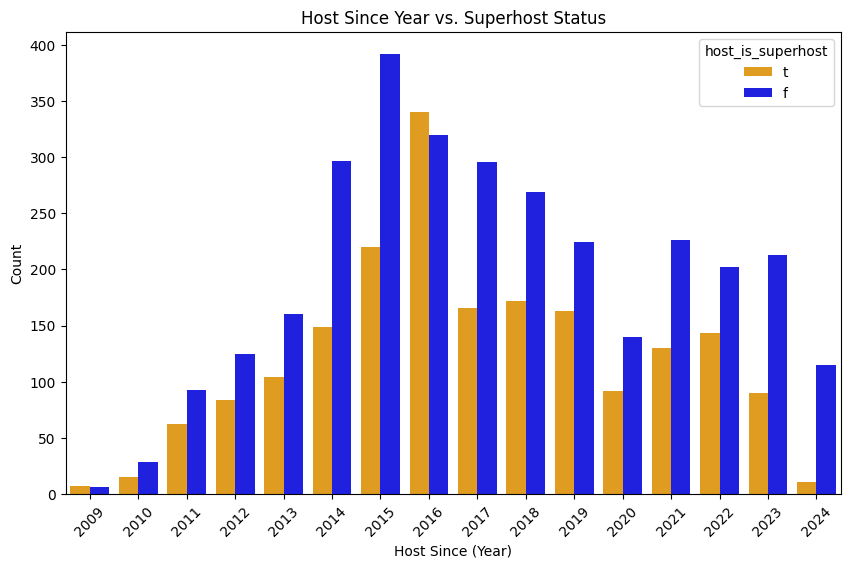

In [ ]:
data['host_since_year'] = pd.to_datetime(data['host_since'], format='%d-%m-%Y').dt.year

# Create the plot
plt.figure(figsize=(10, 6))
sns.countplot(x='host_since_year', hue='host_is_superhost', data=data, palette={'t': 'orange', 'f': 'blue'})
plt.title('Host Since Year vs. Superhost Status')
plt.xlabel('Host Since (Year)')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

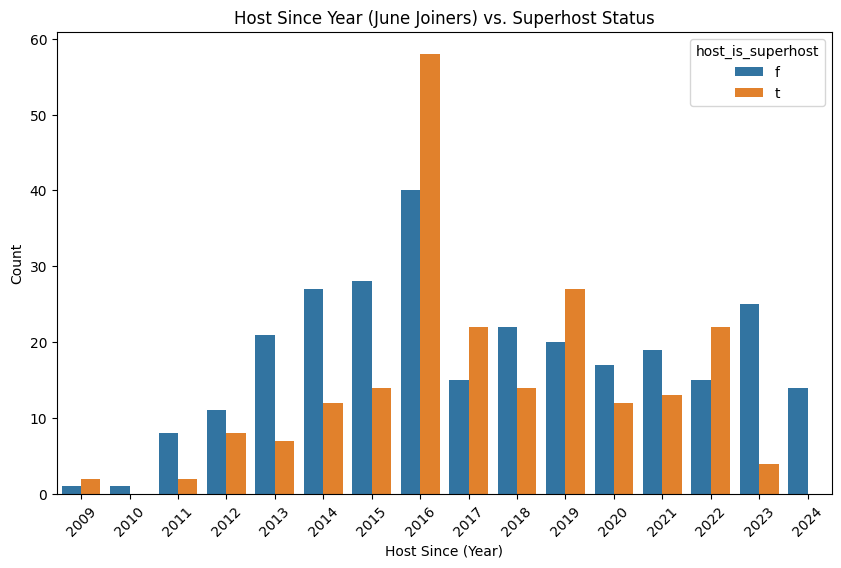

In [ ]:
# prompt: plot a countplot only for host_is_superhost and host_since_june for years (only include those hosts who were hosts in june)

# Filter data for hosts who joined in June
data_june_hosts = data[pd.to_datetime(data['host_since'], format='%d-%m-%Y').dt.month == 6]

# Create the countplot
plt.figure(figsize=(10, 6))
sns.countplot(x='host_since_year', hue='host_is_superhost', data=data_june_hosts)
plt.title('Host Since Year (June Joiners) vs. Superhost Status')
plt.xlabel('Host Since (Year)')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

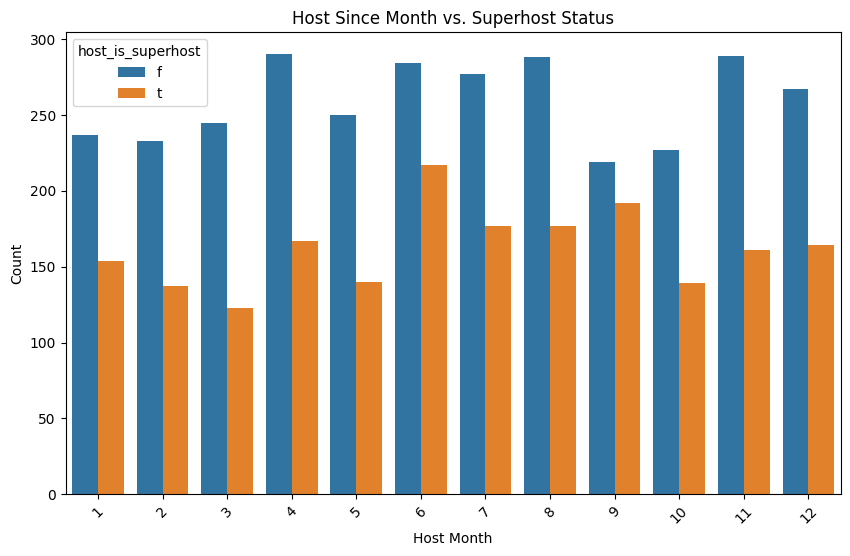

In [ ]:
data['host_started_month'] = pd.to_datetime(data['host_since'], format='%d-%m-%Y').dt.month

# Create the plot
plt.figure(figsize=(10, 6))
sns.countplot(x='host_started_month', hue='host_is_superhost', data=data)
plt.title('Host Since Month vs. Superhost Status')
plt.xlabel('Host Month')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

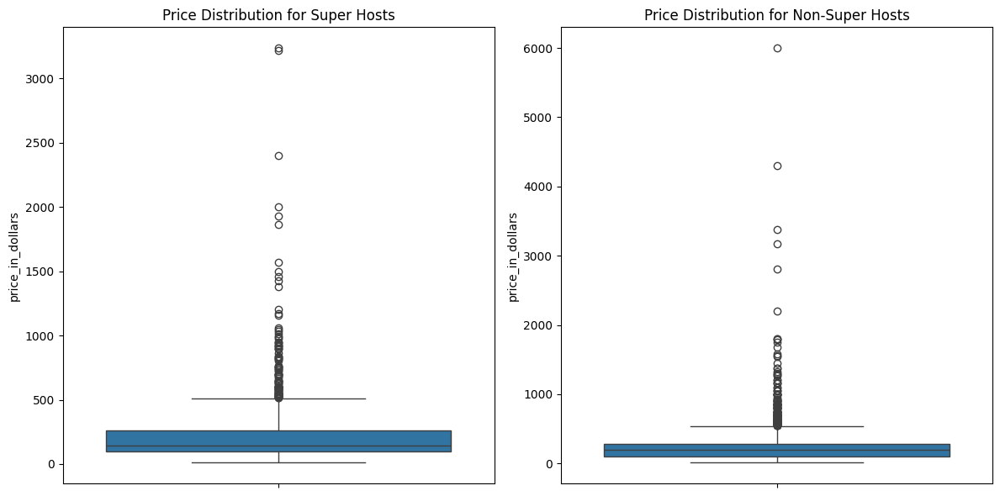

In [ ]:
# prompt: Create 2 boxplots for price_in_dollars : one for superhosts and one for non superhosts

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' DataFrame is already loaded as in your provided code

plt.figure(figsize=(12, 6))

# Boxplot for superhosts
plt.subplot(1, 2, 1)
sns.boxplot(y='price_in_dollars', data=data[data['host_is_superhost'] == 't'])
plt.title('Price Distribution for Super Hosts')

# Boxplot for non-superhosts
plt.subplot(1, 2, 2)
sns.boxplot(y='price_in_dollars', data=data[data['host_is_superhost'] == 'f'])
plt.title('Price Distribution for Non-Super Hosts')

plt.tight_layout()
plt.show()

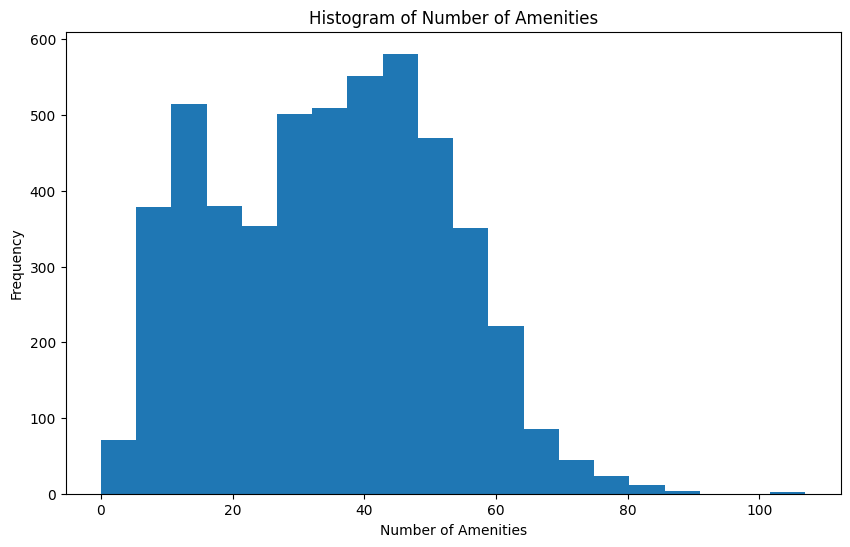

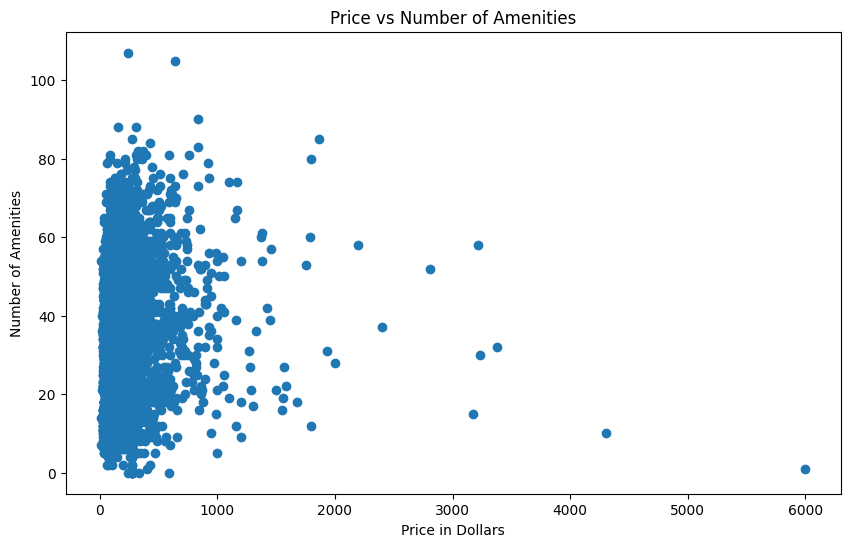

In [ ]:
# prompt: Create a histogram plot between price_in_dollars vs number of amenities( amenities column contains"["am1","am2",...]"

import ast

# Assuming 'data' DataFrame is already loaded as in your provided code
# and 'amenities' column contains strings representing lists

# Convert string representation of lists to actual lists
data['amenities_list'] = data['amenities'].apply(lambda x: ast.literal_eval(x))

# Calculate the number of amenities for each listing
data['number_of_amenities'] = data['amenities_list'].apply(len)

# Create the histogram
plt.figure(figsize=(10, 6))
plt.hist(data['number_of_amenities'], bins=20)  # Adjust bins as needed
plt.xlabel('Number of Amenities')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Amenities')
plt.show()

#Create the scatter plot
plt.figure(figsize=(10,6))
plt.scatter(data['price_in_dollars'], data['number_of_amenities'])
plt.xlabel('Price in Dollars')
plt.ylabel('Number of Amenities')
plt.title('Price vs Number of Amenities')
plt.show()

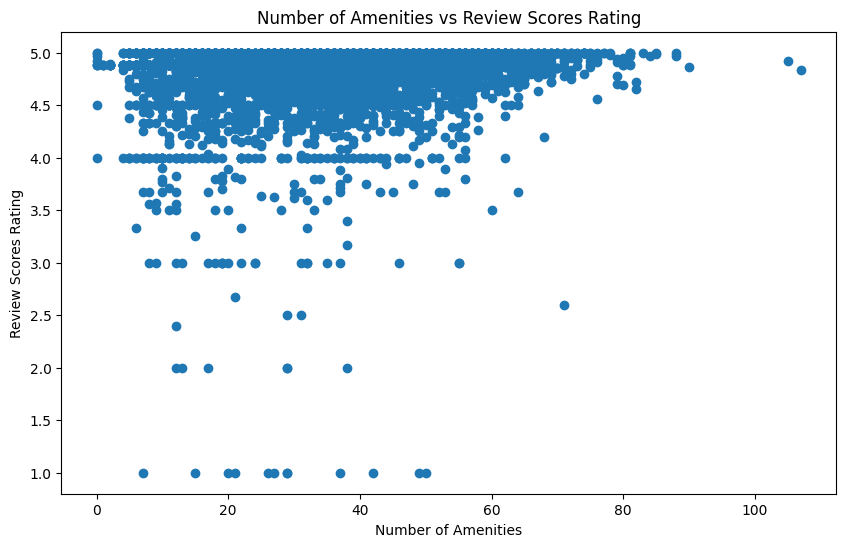

In [ ]:
# prompt: plot between number_of_amenities and review_scores_ratings

#Create the scatter plot
plt.figure(figsize=(10,6))
plt.scatter(data['number_of_amenities'], data['review_scores_rating'])
plt.xlabel('Number of Amenities')
plt.ylabel('Review Scores Rating')
plt.title('Number of Amenities vs Review Scores Rating')
plt.show()

In [ ]:
# prompt: find the most common amenity from amenities , amenities is a string type column example: "["am1", "am2",...]", "["am1","am2"...]

from collections import Counter

# Assuming 'data' DataFrame and 'amenities_list' column are already created as in the previous code

# Flatten the list of amenities
all_amenities = [amenity for sublist in data['amenities_list'] for amenity in sublist]

# Count the occurrences of each amenity
amenity_counts = Counter(all_amenities)
print(amenity_counts)
# Find the most common amenity
most_common_amenity = amenity_counts.most_common(1)[0][0]

print(f"The most common amenity is: {most_common_amenity}")

Counter({'Smoke alarm': 4771, 'Wifi': 4612, 'Kitchen': 4546, 'Carbon monoxide alarm': 4223, 'Essentials': 4021, 'Hot water': 3853, 'Hangers': 3845, 'Dishes and silverware': 3675, 'Hair dryer': 3667, 'Iron': 3628, 'Refrigerator': 3398, 'Microwave': 3391, 'Cooking basics': 3338, 'Fire extinguisher': 3292, 'Bed linens': 3268, 'Self check-in': 3056, 'Air conditioning': 2994, 'Shampoo': 2951, 'Heating': 2888, 'Dedicated workspace': 2859, 'TV': 2745, 'First aid kit': 2605, 'Long term stays allowed': 2444, 'Extra pillows and blankets': 2302, 'Free parking on premises': 2235, 'Cleaning products': 2196, 'Freezer': 2184, 'Oven': 2168, 'Dining table': 2139, 'Toaster': 2111, 'Coffee maker': 2008, 'Wine glasses': 1965, 'Dishwasher': 1955, 'Private entrance': 1955, 'Free street parking': 1922, 'Bathtub': 1921, 'Washer': 1902, 'Exterior security cameras on property': 1864, 'Stove': 1786, 'Coffee': 1776, 'Hot water kettle': 1749, 'Body soap': 1741, 'Shower gel': 1623, 'Conditioner': 1590, 'Room-darken

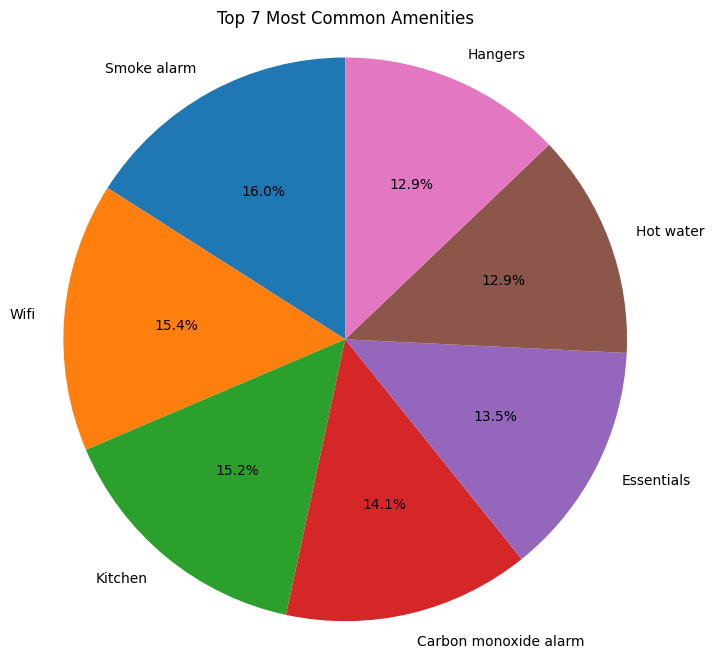

In [ ]:
# prompt: from most_common_amenity create a piechart of top 7 amenities

import matplotlib.pyplot as plt

# Assuming 'amenity_counts' from the previous code is still in memory

# Get the top 7 most common amenities and their counts
top_7_amenities = amenity_counts.most_common(7)

# Extract labels (amenities) and sizes (counts) for the pie chart
labels = [amenity for amenity, count in top_7_amenities]
sizes = [count for amenity, count in top_7_amenities]

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Top 7 Most Common Amenities')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

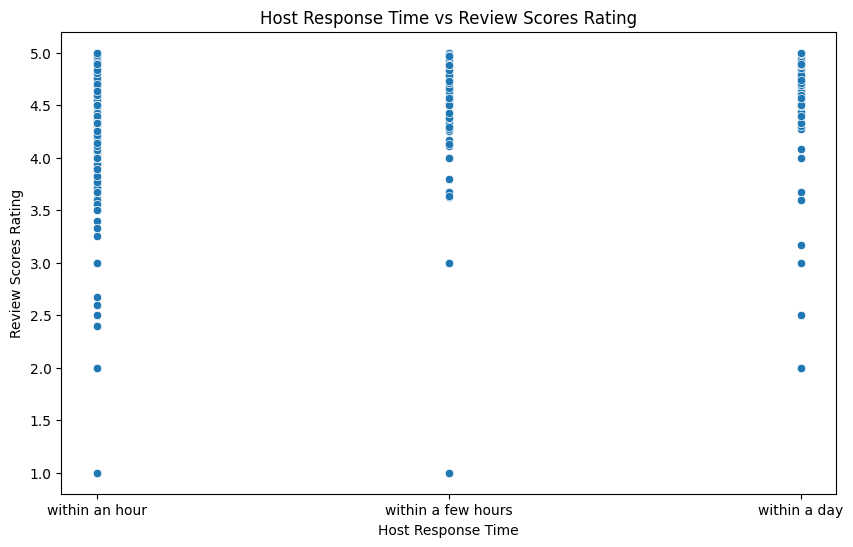

In [ ]:
# prompt: scatter plot between host_response_time (categorical) and review_scores_rating

# Create the scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(x='host_response_time', y='review_scores_rating', data=data)
plt.xlabel('Host Response Time')
plt.ylabel('Review Scores Rating')
plt.title('Host Response Time vs Review Scores Rating')
plt.show()

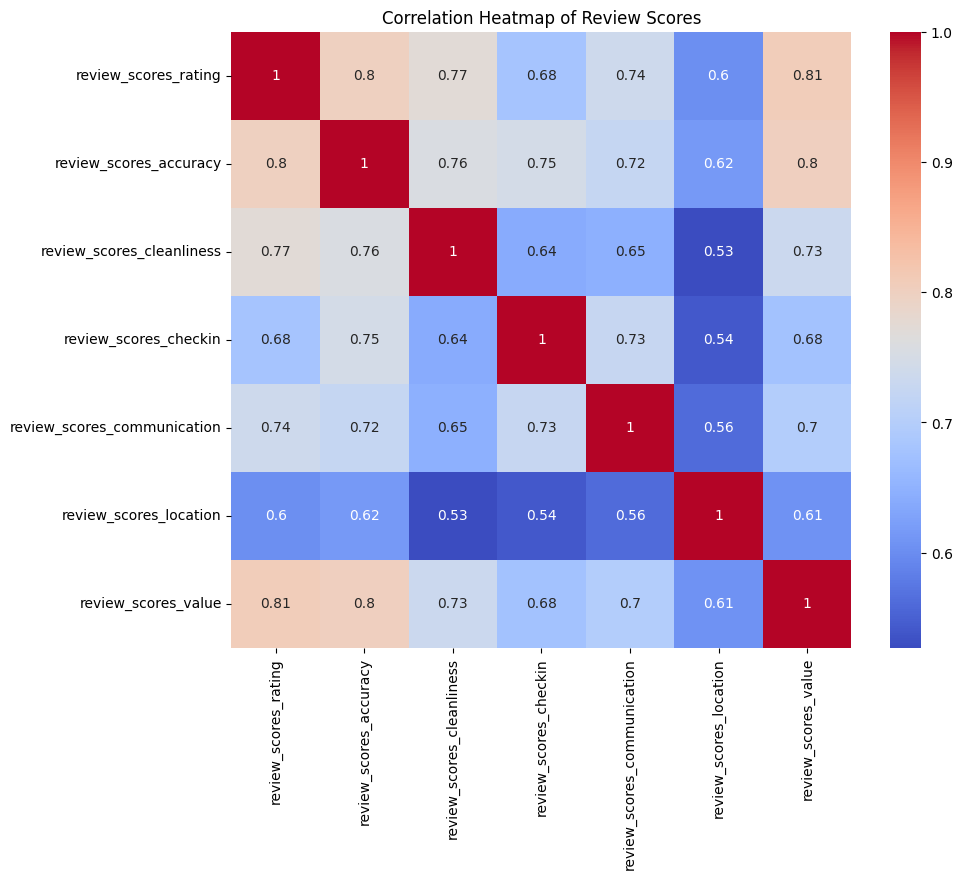

In [ ]:
# prompt: create a heatmap between the review scores

# Assuming 'data' DataFrame is already loaded and processed as in your provided code.

plt.figure(figsize=(10, 8))
sns.heatmap(data[['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                  'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
                  'review_scores_value']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Review Scores')
plt.show()

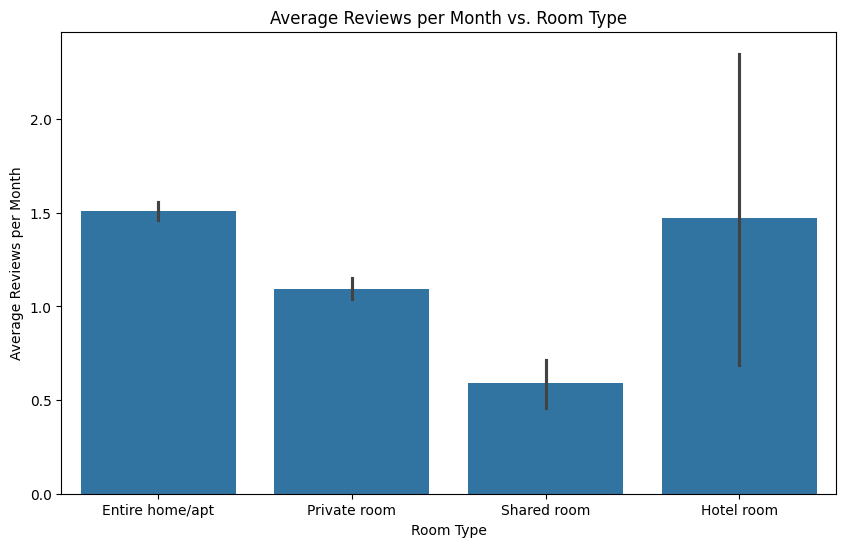

In [ ]:
# prompt: use bar chart for average reviews_per_month vs room_type

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' DataFrame is already loaded and processed as in your provided code.
plt.figure(figsize=(10, 6))
sns.barplot(x='room_type', y='reviews_per_month', data=data)
plt.title('Average Reviews per Month vs. Room Type')
plt.xlabel('Room Type')
plt.ylabel('Average Reviews per Month')
plt.show()

<ipython-input-38-65dffa8721fd>:5: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  data['last_review'] = pd.to_datetime(data['last_review'])


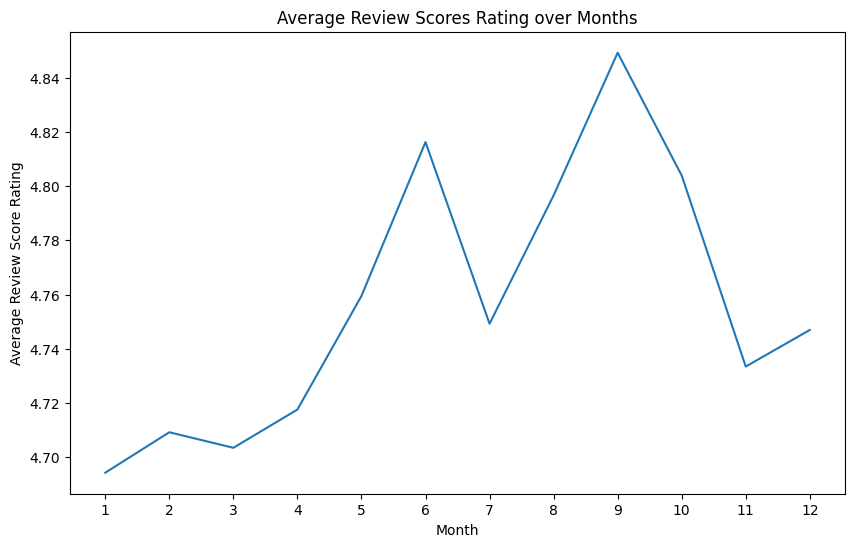

In [ ]:
# prompt: Create a line chart for review_scores_rating over the months (take average of all years)

# Assuming 'data' DataFrame is already loaded and processed as in your provided code.
# Convert 'last_review' to datetime objects
data['last_review'] = pd.to_datetime(data['last_review'])

# Extract month and year
data['review_month'] = data['last_review'].dt.month

# Group by month and calculate the average review score
monthly_avg_ratings = data.groupby('review_month')['review_scores_rating'].mean()

# Create the line chart
plt.figure(figsize=(10, 6))
plt.plot(monthly_avg_ratings.index, monthly_avg_ratings.values)
plt.xlabel('Month')
plt.ylabel('Average Review Score Rating')
plt.title('Average Review Scores Rating over Months')
plt.xticks(range(1, 13)) # Ensure all months are displayed on x-axis
plt.show()

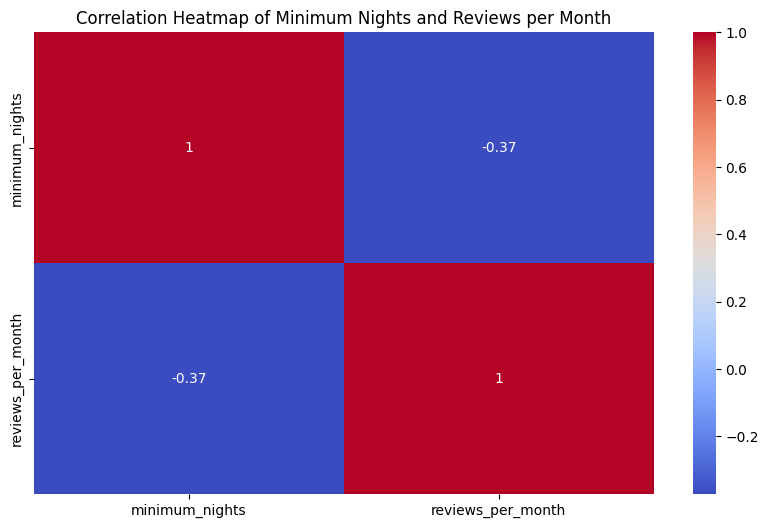

In [ ]:
# prompt: Use a heatmap to correlate minimum nights required (minimum_nights) with occupancy rates or reviews per month.

# Assuming 'data' DataFrame is already loaded and processed as in your provided code.

plt.figure(figsize=(10, 6))
sns.heatmap(data[['minimum_nights', 'reviews_per_month']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Minimum Nights and Reviews per Month')
plt.show()

In [ ]:
import plotly.express as px

# Assuming 'data' DataFrame is already loaded and processed
# Group the data by city and neighborhood, then count the listings
neighborhood_counts = data.groupby(['cityName', 'neighbourhood_cleansed'])['id'].count().reset_index()
neighborhood_counts.rename(columns={'id': 'listing_count'}, inplace=True)

# Get unique city names
unique_cities = neighborhood_counts['cityName'].unique()

# Create separate treemaps for each city
for city in unique_cities:
    city_data = neighborhood_counts[neighborhood_counts['cityName'] == city]
    fig = px.treemap(city_data,
                     path=['neighbourhood_cleansed'],  # Only neighborhood for this city
                     values='listing_count',
                     title=f'Number of Listings per Neighborhood in {city}')
    fig.show()

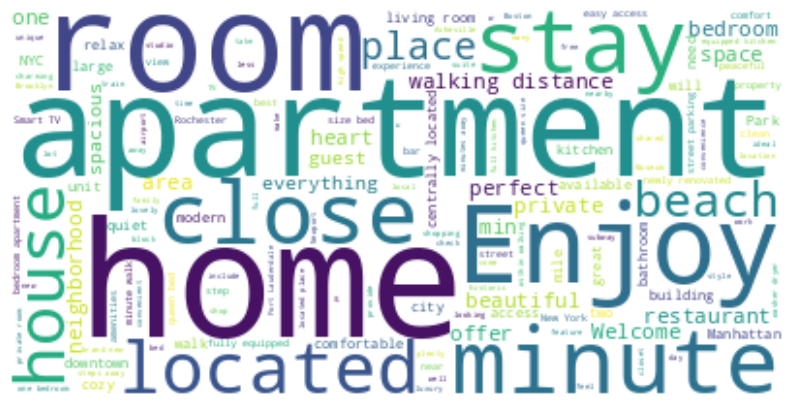

In [ ]:
# prompt: create a word cloud for the most popular words of the "description" column of the data, ignore filler words

from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Assuming 'data' DataFrame is already loaded and processed as in your provided code.

# Combine all descriptions into a single string
text = " ".join(review for review in data.description.astype(str))

# Create a set of stopwords
stopwords = set(STOPWORDS)
# Add custom stopwords
stopwords.update(["the", "a", "an", "and", "is", "are", "of", "in", "to", "it", "that", "for", "with", "on", "as", "be", "this", "have", "from","br"])


# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.figure(figsize=(10, 6)) # Adjust the figure size as needed
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

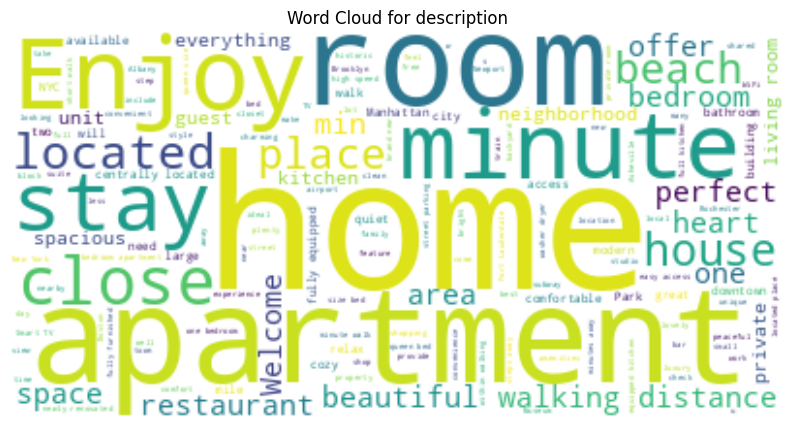

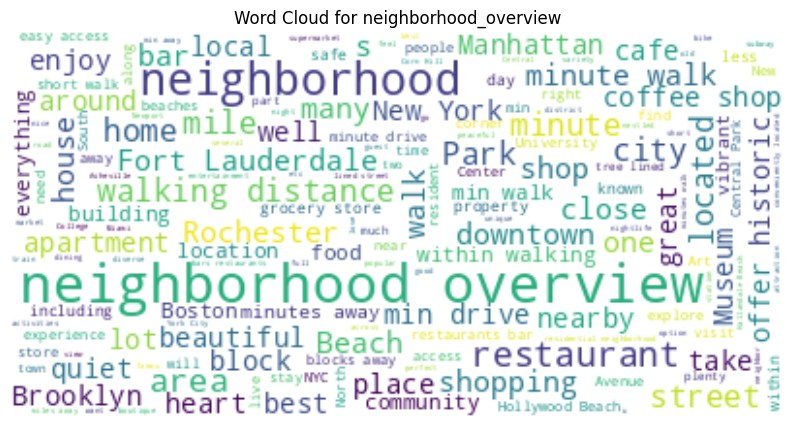

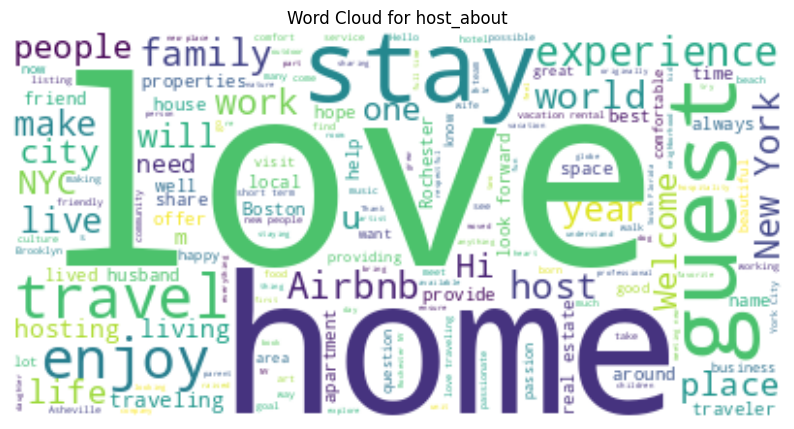

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Assuming 'data' DataFrame is already loaded

# Define a function to create and display a word cloud
def create_wordcloud(text_column, title):
    text = " ".join(review for review in data[text_column].astype(str))
    stopwords = set(STOPWORDS)
    stopwords.update(["the", "a", "an", "and", "is", "are", "of", "in", "to", "it", "that", "for", "with", "on", "as", "be", "this", "have", "from", "br"])
    wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)  # Set title for each word cloud
    plt.show()

# Get a list of text columns in your DataFrame
text_columns = ["description","neighborhood_overview","host_about","neighbo"]

# Create a word cloud for each text column
for column in text_columns:
    create_wordcloud(column, f"Word Cloud for {column}")

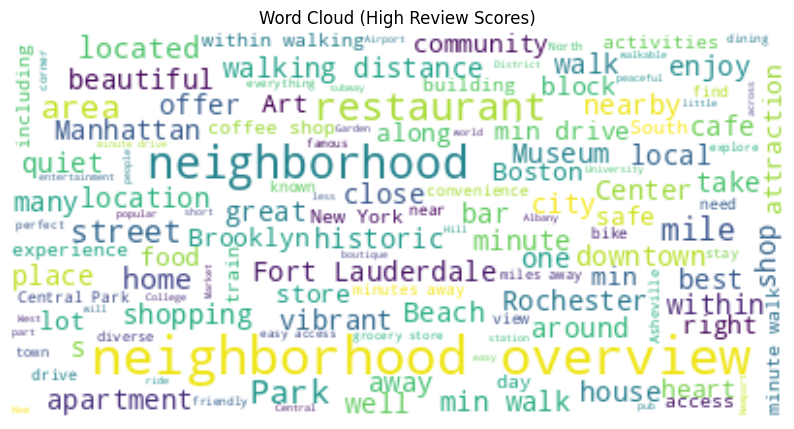

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Assuming 'data' DataFrame is already loaded

# Filter data for listings with review_scores_rating >= 4.8
high_rating_data = data[data['review_scores_rating'] >= 5.0]

# Define a function to create and display a word cloud
def create_wordcloud(text_column, title):
    text = " ".join(review for review in high_rating_data[text_column].astype(str))
    stopwords = set(STOPWORDS)
    stopwords.update(["the", "a", "an", "and", "is", "are", "of", "in", "to", "it", "that", "for", "with", "on", "as", "be", "this", "have", "from", "br"])
    wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)  # Set title for each word cloud
    plt.show()

# Create word cloud for host_about for high-rated listings
create_wordcloud("neighborhood_overview", "Word Cloud (High Review Scores)")